# Music recommender - Collaborative based Filtering

Collaborative Filters aim is to learn a function that can predict if a user will benefit from an item - meaning the user will likely listen to item.

Among collaborative-based systems, we can encounter two types: **user-item** filtering and **item-item** filtering.

*What algorithms do collaborative filters use to recommend new songs?* There are several machine learning algorithms that can be used in the case of collaborative filtering. Among them, we can mention nearest-neighbor, clustering, and matrix factorization.

# Importing Libraries and [Dataset](https://www.kaggle.com/code/vatsalmavani/music-recommendation-system-using-spotify-dataset/input)

In [ ]:
!pip install anvil-uplink
import anvil.server
anvil.server.connect("server_Z5R5QXV7FECLNJJC3ZRFJ36N-6XEY6GYKJ4DHLXXV")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 90.1/90.1 kB 1.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 51.4/51.4 kB 5.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for ws4py: filename=ws4py-0.5.1-py3-none-any.whl size=45227 sha256=a45e6499ee50db1bb9431654b257ae03b761965843a4bfbb2776a7b91706f2ce
  Stored in directory: /root/.cache/pip/wheels/2e/7c/ad/d9c746276bf024d44296340869fcb169f1e5d80fb147351a57
Successfully built ws4py


Connecting to wss://anvil.works/uplink
Anvil websocket open
Connected to "Default Environment" as SERVER


In [ ]:
import os
import numpy as np
import pandas as pd

import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.metrics import euclidean_distances
from scipy.spatial.distance import cdist

import warnings
warnings.filterwarnings("ignore")

In [ ]:
data = pd.read_csv("/content/drive/MyDrive/Music Recommendation System using Spotify Dataset/data.csv")
genre_data = pd.read_csv('/content/drive/MyDrive/Music Recommendation System using Spotify Dataset/data_by_genres.csv')
year_data = pd.read_csv('/content/drive/MyDrive/Music Recommendation System using Spotify Dataset/data_by_year.csv')

In [ ]:
print(data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 170653 entries, 0 to 170652
Data columns (total 19 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   valence           170653 non-null  float64
 1   year              170653 non-null  int64  
 2   acousticness      170653 non-null  float64
 3   artists           170653 non-null  object 
 4   danceability      170653 non-null  float64
 5   duration_ms       170653 non-null  int64  
 6   energy            170653 non-null  float64
 7   explicit          170653 non-null  int64  
 8   id                170653 non-null  object 
 9   instrumentalness  170653 non-null  float64
 10  key               170653 non-null  int64  
 11  liveness          170653 non-null  float64
 12  loudness          170653 non-null  float64
 13  mode              170653 non-null  int64  
 14  name              170653 non-null  object 
 15  popularity        170653 non-null  int64  
 16  release_date      17

In [ ]:
print(genre_data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2973 entries, 0 to 2972
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   mode              2973 non-null   int64  
 1   genres            2973 non-null   object 
 2   acousticness      2973 non-null   float64
 3   danceability      2973 non-null   float64
 4   duration_ms       2973 non-null   float64
 5   energy            2973 non-null   float64
 6   instrumentalness  2973 non-null   float64
 7   liveness          2973 non-null   float64
 8   loudness          2973 non-null   float64
 9   speechiness       2973 non-null   float64
 10  tempo             2973 non-null   float64
 11  valence           2973 non-null   float64
 12  popularity        2973 non-null   float64
 13  key               2973 non-null   int64  
dtypes: float64(11), int64(2), object(1)
memory usage: 325.3+ KB
None


In [ ]:
print(year_data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   mode              100 non-null    int64  
 1   year              100 non-null    int64  
 2   acousticness      100 non-null    float64
 3   danceability      100 non-null    float64
 4   duration_ms       100 non-null    float64
 5   energy            100 non-null    float64
 6   instrumentalness  100 non-null    float64
 7   liveness          100 non-null    float64
 8   loudness          100 non-null    float64
 9   speechiness       100 non-null    float64
 10  tempo             100 non-null    float64
 11  valence           100 non-null    float64
 12  popularity        100 non-null    float64
 13  key               100 non-null    int64  
dtypes: float64(11), int64(3)
memory usage: 11.1 KB
None


# Data Exploration and Visualization

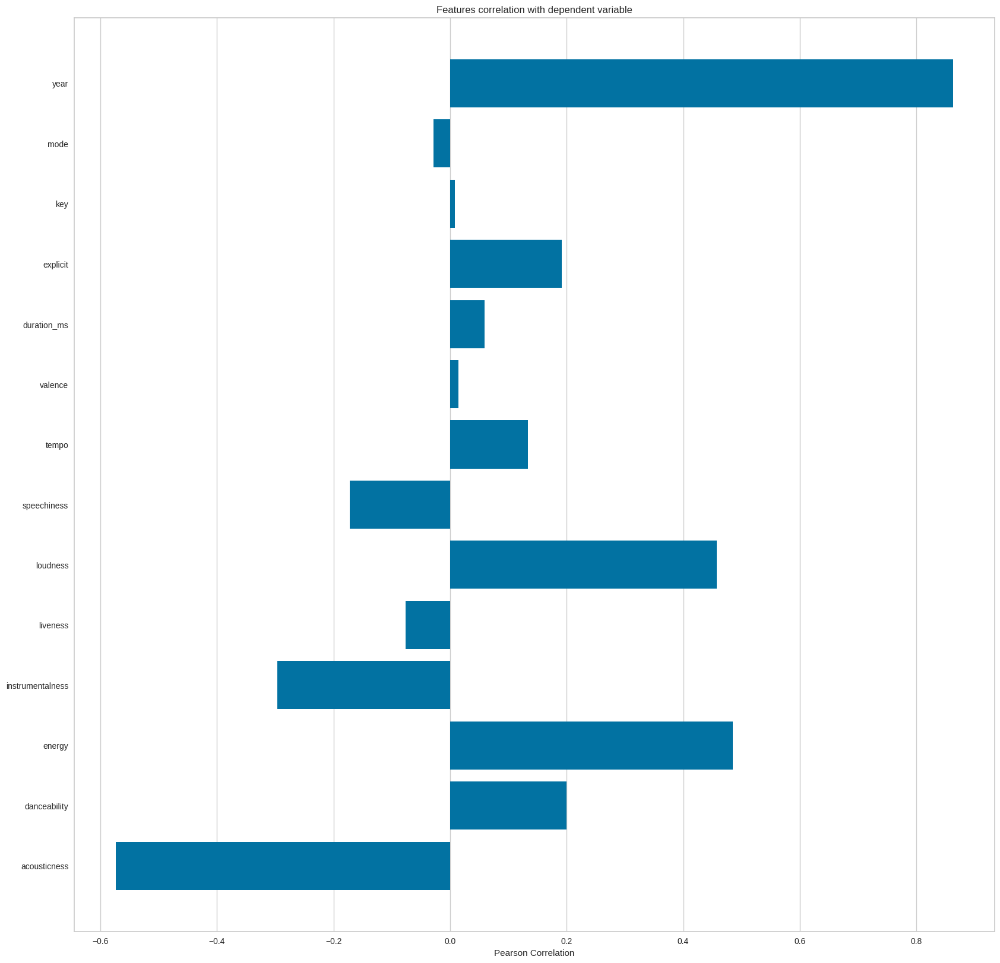

<Axes: title={'center': 'Features correlation with dependent variable'}, xlabel='Pearson Correlation'>

In [ ]:
from yellowbrick.target import FeatureCorrelation

feature_names = ['acousticness', 'danceability', 'energy', 'instrumentalness',
       'liveness', 'loudness', 'speechiness', 'tempo', 'valence','duration_ms','explicit','key','mode','year']

X, y = data[feature_names], data['popularity']

# Create a list of the feature names
features = np.array(feature_names)

# Instantiate the visualizer
visualizer = FeatureCorrelation(labels=features)

plt.rcParams['figure.figsize']=(20,20)
visualizer.fit(X, y)     # Fit the data to the visualizer
visualizer.show()

Count of songs for each decade

<Axes: xlabel='decade', ylabel='count'>

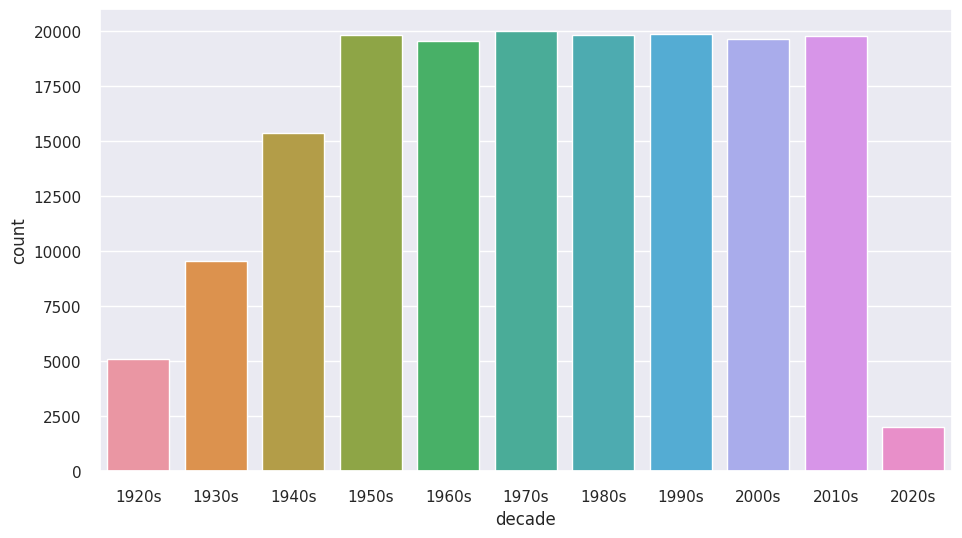

In [ ]:
def get_decade(year):
    period_start = int(year/10) * 10
    decade = '{}s'.format(period_start)
    return decade

data['decade'] = data['year'].apply(get_decade)
sns.set(rc={'figure.figsize':(11 ,6)})
sns.countplot(data[['decade']], x='decade')


Line plot of sound features for each decade

In [ ]:
sound_features = ['acousticness', 'danceability', 'energy', 'instrumentalness', 'liveness', 'valence']
fig = px.line(year_data, x='year', y=sound_features)
fig.show()

Bar plot of genres

This dataset contains the audio features for different songs along with the audio features for different genres. We can use this information to compare different genres and understand their unique differences in sound.

In [ ]:
top10_genres = genre_data.nlargest(10, 'popularity')

fig = px.bar(top10_genres, x='genres', y=['valence', 'energy', 'danceability', 'acousticness'], barmode='group')
fig.show()

# Clustering:

- The K-means clustering algorithm is used to divide the genres in this dataset into ten clusters based on the numerical audio features of each genres.

- KMeans clustering is performed on genre_data to cluster different music genres.
- The clusters are visualized using t-SNE to reduce dimensions for better visualization.
- t-SNE stands for t-distributed Stochastic Neighbor Embedding. It's a dimensionality reduction technique particularly well-suited for visualizing high-dimensional data in a low-dimensional space (usually 2D or 3D) while preserving the local structure of the data as much as possible.


In [ ]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

cluster_pipeline = Pipeline([('scaler', StandardScaler()), ('kmeans', KMeans(n_clusters=10))])
X = genre_data.select_dtypes(np.number)
cluster_pipeline.fit(X)
genre_data['cluster'] = cluster_pipeline.predict(X)

In [ ]:
# Visualizing the Clusters with t-SNE

from sklearn.manifold import TSNE

tsne_pipeline = Pipeline([('scaler', StandardScaler()), ('tsne', TSNE(n_components=2, verbose=1))])
genre_embedding = tsne_pipeline.fit_transform(X)
projection = pd.DataFrame(columns=['x', 'y'], data=genre_embedding)
projection['genres'] = genre_data['genres']
projection['cluster'] = genre_data['cluster']

fig = px.scatter(
    projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'genres'])
fig.show()

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 2973 samples in 0.008s...
[t-SNE] Computed neighbors for 2973 samples in 0.333s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2973
[t-SNE] Computed conditional probabilities for sample 2000 / 2973
[t-SNE] Computed conditional probabilities for sample 2973 / 2973
[t-SNE] Mean sigma: 0.777516
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.106369
[t-SNE] KL divergence after 1000 iterations: 1.392217


# Song Clustering and Visualization:

- KMeans clustering is applied to data (presumably song data) to cluster songs into different groups.
- PCA is used for dimensionality reduction, and a scatter plot is created to visualize song clusters.
- PCA - Principal Component Analysis - a dimensionality reduction technique commonly used in machine learning and data analysis to reduce the number of features (variables) in a dataset while preserving the most important information

In [ ]:
song_cluster_pipeline = Pipeline([('scaler', StandardScaler()),
                                  ('kmeans', KMeans(n_clusters=20,
                                   verbose=False))
                                 ], verbose=False)

X = data.select_dtypes(np.number)
number_cols = list(X.columns)
song_cluster_pipeline.fit(X)
song_cluster_labels = song_cluster_pipeline.predict(X)
data['cluster_label'] = song_cluster_labels

In [ ]:
# Visualizing the Clusters with PCA

from sklearn.decomposition import PCA

pca_pipeline = Pipeline([('scaler', StandardScaler()), ('PCA', PCA(n_components=2))])
song_embedding = pca_pipeline.fit_transform(X)
projection = pd.DataFrame(columns=['x', 'y'], data=song_embedding)
projection['title'] = data['name']
projection['cluster'] = data['cluster_label']

fig = px.scatter(
    projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'title'])
fig.show()

This observation makes perfect sense. Similar genres will sound similar and will come from similar time periods while the same can be said for songs within those genres. We can use this idea to build a recommendation system by taking the data points of the songs a user has listened to and recommending songs corresponding to nearby data points.

# Spotipy Integration:

- Spotipy, a Python library for the Spotify Web API, is installed and imported.
- Functions are defined to search for songs, retrieve song data from Spotify, and recommend similar songs based on a given list of songs.

In [ ]:
!pip install spotipy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 250.3/250.3 kB 4.9 MB/s eta 0:00:00


In [ ]:
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials
from collections import defaultdict

sp = spotipy.Spotify(auth_manager=SpotifyClientCredentials(client_id="fde2bdc9cf9e4dd8ae698c42147757f0",
                                                           client_secret="43ae17334b364297b21707d30c34826d"))

def find_song(name, year):
    '''Get song data from spotify'''
    song_data = defaultdict()
    results = sp.search(q= 'track: {} year: {}'.format(name,year), limit=1)
    if results['tracks']['items'] == []:
        return None

    results = results['tracks']['items'][0]
    track_id = results['id']
    audio_features = sp.audio_features(track_id)[0]

    song_data['name'] = [name]
    song_data['year'] = [year]
    song_data['explicit'] = [int(results['explicit'])]
    song_data['duration_ms'] = [results['duration_ms']]
    song_data['popularity'] = [results['popularity']]

    for key, value in audio_features.items():
        song_data[key] = value

    return pd.DataFrame(song_data)

In [ ]:
from collections import defaultdict
from sklearn.metrics import euclidean_distances
from scipy.spatial.distance import cdist
import difflib

number_cols = ['valence', 'year', 'acousticness', 'danceability', 'duration_ms', 'energy', 'explicit',
 'instrumentalness', 'key', 'liveness', 'loudness', 'mode', 'popularity', 'speechiness', 'tempo']


def get_song_data(song, spotify_data):
    ''' Get song data either from the provided dataset or by querying the Spotify API'''
    try:
        song_data = spotify_data[(spotify_data['name'] == song['name'])
                                & (spotify_data['year'] == song['year'])].iloc[0]
        return song_data

    except IndexError:
        return find_song(song['name'], song['year'])


def get_mean_vector(song_list, spotify_data):
    '''Calculate the mean vector of song features for a given list of songs.\
    Uses get_song_data to retrieve song features and constructs a matrix of song vectors.'''
    song_vectors = []

    for song in song_list:
        song_data = get_song_data(song, spotify_data)
        if song_data is None:
            print('Warning: {} does not exist in Spotify or in database'.format(song['name']))
            continue
        song_vector = song_data[number_cols].values
        song_vectors.append(song_vector)

    song_matrix = np.array(list(song_vectors))
    return np.mean(song_matrix, axis=0)


def flatten_dict_list(dict_list):
    '''Store all name values and year values in single key'''
    flattened_dict = defaultdict()
    for key in dict_list[0].keys():
        flattened_dict[key] = []

    for dictionary in dict_list:
        for key, value in dictionary.items():
            flattened_dict[key].append(value)

    # print(flattened_dict)
    return flattened_dict


def recommend_songs(song_list, spotify_data, n_songs=10):
    '''Takes a list of songs and a dataset of songs as input.\
    Calculates the mean vector of the provided song list using get_mean_vector.
    Calculates the cosine distances between this mean vector and the song dataset.
    Selects the top n_songs songs with the lowest cosine distances (most similar) and\
    returns their metadata (name, year, artists) as a list of dictionaries.'''
    song_list = song_list.split(',')  # Split the input string into a list of song names
    song_dict_list = []  # Create an empty list to store dictionaries of song name and year

    for song_name in song_list:
        # Search for the song name in your dataset to find its year
        song_data = spotify_data[spotify_data['name'] == song_name.strip()]
        if not song_data.empty:
            year = song_data.iloc[0]['year']
            song_dict_list.append({'name': song_name.strip(), 'year': year})
    # print(song_dict_list)
    metadata_cols = ['name', 'year', 'artists']
    song_dict = flatten_dict_list(song_dict_list)

    # Calculates the mean vector of the song features for the provided list of songs
    song_center = get_mean_vector(song_dict_list, spotify_data)

    # Uses a scaler (presumably from a song_cluster_pipeline) to scale the spotify_data features
    # It scales the song_center (mean vector of input songs) to the same scale
    # Then, it computes cosine distances between the scaled mean vector (scaled_song_center) and the scaled song dataset (scaled_data).
    scaler = song_cluster_pipeline.steps[0][1]
    scaled_data = scaler.transform(spotify_data[number_cols])
    scaled_song_center = scaler.transform(song_center.reshape(1, -1))
    distances = cdist(scaled_song_center, scaled_data, 'cosine')

    # Sorts the distances and selects the indices of the top n_songs with the lowest cosine distances,
    # assuming those are the most similar songs.
    index = list(np.argsort(distances)[:, :n_songs][0])

    rec_songs = spotify_data.iloc[index]
    rec_songs = rec_songs[~rec_songs['name'].isin(song_dict['name'])] #filter given songs if exist
    return rec_songs[metadata_cols].to_dict(orient='records')

@anvil.server.callable
def get_recommendations(song_names):
    recommendations = recommend_songs(song_names, data)
    formatted_output = "Recommended Songs:\n"

    for idx, song in enumerate(recommendations, start=1):
        formatted_output += f"{idx}. {song['name']} - {song['artists']} ({song['year']})\n"

    return formatted_output


In [ ]:
import random
@anvil.server.callable
def get_song_names_collab():
    # Select 10 random song names from the dataset
    random_songs = data['name'].sample(n=10)
    return ',\n'.join(random_songs)

In [ ]:
print(get_recommendations('Come As You Are,Smells Like Teen Spirit,Lithium,All Apologies,Stay Away'))
print(get_song_names_collab())

Recommended Songs:
1. Sharp Dressed Man - 2008 Remaster - ['ZZ Top'] (1983)
2. Far Away - ['Nickelback'] (2005)
3. Red Dirt Road - ['Brooks & Dunn'] (2003)
4. My Wish - ['Rascal Flatts'] (2006)
5. Born in the U.S.A. - ['Bruce Springsteen'] (1984)
6. Believe - ['Cher'] (1998)
7. Have A Nice Day - ['Bon Jovi'] (2005)
8. Heart Of Glass (Live from the iHeart Festival) - ['Miley Cyrus'] (2020)
9. Knockin' On Heaven's Door - ["Guns N' Roses"] (1991)

Maria mari' - Musical base Version,
Armando's Rhumba,
La Puerta,
Bird Calls,
Like Whoa,
Something Happened on the Way to Heaven - Live 1990; 2019 Remaster,
Eyeless,
Slow Dance,
I Want to Be Your Man,
Gospel Groove


In [ ]:
anvil.server.wait_forever()

KeyboardInterrupt: ignored